<a href="https://colab.research.google.com/github/sameedsajid26/Data-Science-and-ML/blob/main/Assignment_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving training.csv to training.csv


In [ ]:
import pandas as pd
import io
dftraining = pd.read_csv(io.BytesIO(uploaded['training.csv']))

In [ ]:
uploaded = files.upload()

Saving testing.csv to testing.csv


In [ ]:
dftesting = pd.read_csv(io.BytesIO(uploaded['testing.csv']))

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.ensemble import RandomForestClassifier


In [ ]:
dftraining.head()

,class,b1,b2,b3,b4,b5,b6,b7,b8,b9,...,pred_minus_obs_H_b9,pred_minus_obs_S_b1,pred_minus_obs_S_b2,pred_minus_obs_S_b3,pred_minus_obs_S_b4,pred_minus_obs_S_b5,pred_minus_obs_S_b6,pred_minus_obs_S_b7,pred_minus_obs_S_b8,pred_minus_obs_S_b9
0,d,39,36,57,91,59,101,93,27,60,...,-2.36,-18.41,-1.88,-6.43,-21.03,-1.60,-6.18,-22.50,-5.20,-7.86
1,h,84,30,57,112,51,98,92,26,62,...,-2.26,-16.27,-1.95,-6.25,-18.79,-1.99,-6.18,-23.41,-8.87,-10.83
2,s,53,25,49,99,51,93,84,26,58,...,-1.46,-15.92,-1.79,-4.64,-17.73,-0.48,-4.69,-19.97,-4.10,-7.07
3,s,59,26,49,103,47,92,82,25,56,...,2.68,-13.77,-2.53,-6.34,-22.03,-2.34,-6.60,-27.10,-7.99,-10.81
4,d,57,49,66,103,64,106,114,28,59,...,-2.94,-21.74,-1.64,-4.62,-23.74,-0.85,-5.50,-22.83,-2.74,-5.84


In [ ]:
dftraining.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 198 entries, 0 to 197
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   class                198 non-null    object 
 1   b1                   198 non-null    int64  
 2   b2                   198 non-null    int64  
 3   b3                   198 non-null    int64  
 4   b4                   198 non-null    int64  
 5   b5                   198 non-null    int64  
 6   b6                   198 non-null    int64  
 7   b7                   198 non-null    int64  
 8   b8                   198 non-null    int64  
 9   b9                   198 non-null    int64  
 10  pred_minus_obs_H_b1  198 non-null    float64
 11  pred_minus_obs_H_b2  198 non-null    float64
 12  pred_minus_obs_H_b3  198 non-null    float64
 13  pred_minus_obs_H_b4  198 non-null    float64
 14  pred_minus_obs_H_b5  198 non-null    float64
 15  pred_minus_obs_H_b6  198 non-null    flo

In [ ]:
 dftraining.describe(include='all')

,class,b1,b2,b3,b4,b5,b6,b7,b8,b9,...,pred_minus_obs_H_b9,pred_minus_obs_S_b1,pred_minus_obs_S_b2,pred_minus_obs_S_b3,pred_minus_obs_S_b4,pred_minus_obs_S_b5,pred_minus_obs_S_b6,pred_minus_obs_S_b7,pred_minus_obs_S_b8,pred_minus_obs_S_b9
count,198,198.000000,198.000000,198.000000,198.000000,198.000000,198.000000,198.000000,198.000000,198.000000,...,198.000000,198.000000,198.000000,198.000000,198.000000,198.000000,198.000000,198.000000,198.000000,198.000000
unique,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,s,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,59,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,62.949495,41.020202,63.676768,101.409091,58.732323,100.651515,90.601010,28.691919,61.116162,...,-5.594141,-20.037576,-1.007121,-4.355657,-20.996919,-0.973737,-4.597626,-18.840000,-1.570808,-4.155859
std,NaN,12.779563,17.832543,17.314545,14.804627,12.392648,11.190314,15.588861,8.977752,9.787158,...,9.769193,4.948562,1.783671,2.352311,6.490763,0.702619,1.736712,5.251095,1.807792,1.982423
min,NaN,34.000000,25.000000,47.000000,54.000000,44.000000,84.000000,54.000000,21.000000,50.000000,...,-53.530000,-32.950000,-8.800000,-11.210000,-40.370000,-3.270000,-8.730000,-34.140000,-8.870000,-10.830000
25%,NaN,54.000000,28.000000,52.000000,92.250000,49.000000,92.000000,80.000000,24.000000,55.000000,...,-6.627500,-23.325000,-1.860000,-5.790000,-24.090000,-1.290000,-5.747500,-22.237500,-2.370000,-5.122500
50%,NaN,60.000000,31.500000,57.000000,99.500000,55.000000,98.000000,91.000000,25.000000,58.000000,...,-2.255000,-20.020000,-0.970000,-4.350000,-20.465000,-0.945000,-4.540000,-19.200000,-1.420000,-4.125000
75%,NaN,70.750000,50.750000,69.000000,111.750000,65.000000,107.000000,101.000000,27.000000,63.000000,...,0.247500,-17.787500,-0.042500,-2.882500,-17.955000,-0.642500,-3.617500,-16.227500,-0.655000,-3.105000


In [ ]:
targets = dftraining['class']

In [ ]:
targets

0      d 
1      h 
2      s 
3      s 
4      d 
       ..
193    d 
194    d 
195    h 
196    h 
197    h 
Name: class, Length: 198, dtype: object

In [ ]:
# data=dftraining.drop(labels=['class'],axis=1)
# x=data.values
# min_max_scaler = preprocessing.MinMaxScaler()
# x_scaled = min_max_scaler.fit_transform(x)
# data=pd.DataFrame(x_scaled, columns=data.columns)

In [ ]:
train_columns = dftraining.columns

In [ ]:
train_columns = train_columns[1:]

In [ ]:
x_train = dftraining[train_columns]

In [ ]:
y_train = dftraining['class']

In [ ]:
x_train

,b1,b2,b3,b4,b5,b6,b7,b8,b9,pred_minus_obs_H_b1,...,pred_minus_obs_H_b9,pred_minus_obs_S_b1,pred_minus_obs_S_b2,pred_minus_obs_S_b3,pred_minus_obs_S_b4,pred_minus_obs_S_b5,pred_minus_obs_S_b6,pred_minus_obs_S_b7,pred_minus_obs_S_b8,pred_minus_obs_S_b9
0,39,36,57,91,59,101,93,27,60,75.70,...,-2.36,-18.41,-1.88,-6.43,-21.03,-1.60,-6.18,-22.50,-5.20,-7.86
1,84,30,57,112,51,98,92,26,62,30.58,...,-2.26,-16.27,-1.95,-6.25,-18.79,-1.99,-6.18,-23.41,-8.87,-10.83
2,53,25,49,99,51,93,84,26,58,63.20,...,-1.46,-15.92,-1.79,-4.64,-17.73,-0.48,-4.69,-19.97,-4.10,-7.07
3,59,26,49,103,47,92,82,25,56,55.54,...,2.68,-13.77,-2.53,-6.34,-22.03,-2.34,-6.60,-27.10,-7.99,-10.81
4,57,49,66,103,64,106,114,28,59,59.44,...,-2.94,-21.74,-1.64,-4.62,-23.74,-0.85,-5.50,-22.83,-2.74,-5.84
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193,55,61,90,75,55,91,84,24,54,57.14,...,1.28,-20.84,-1.47,-5.72,-18.73,-1.18,-5.22,-17.81,-1.28,-3.87
194,66,69,93,90,63,100,99,25,57,45.97,...,-1.50,-19.64,-1.45,-5.60,-17.03,-1.08,-5.15,-16.77,-1.46,-4.03
195,79,30,55,115,51,96,109,25,59,35.40,...,-3.66,-22.40,-3.91,-6.61,-36.29,-2.13,-5.77,-23.32,-2.09,-4.13
196,69,27,53,106,47,90,87,24,55,35.81,...,-0.88,-13.32,0.16,-2.39,-7.12,0.02,-2.06,-10.04,-0.74,-2.88


In [ ]:
y_train

0      d 
1      h 
2      s 
3      s 
4      d 
       ..
193    d 
194    d 
195    h 
196    h 
197    h 
Name: class, Length: 198, dtype: object

In [ ]:
test_columns = dftesting.columns

In [ ]:
test_columns = test_columns[1:]

In [ ]:
x_test = dftesting[test_columns]

In [ ]:
y_test = dftesting['class']

In [ ]:
x_test

,b1,b2,b3,b4,b5,b6,b7,b8,b9,pred_minus_obs_H_b1,...,pred_minus_obs_H_b9,pred_minus_obs_S_b1,pred_minus_obs_S_b2,pred_minus_obs_S_b3,pred_minus_obs_S_b4,pred_minus_obs_S_b5,pred_minus_obs_S_b6,pred_minus_obs_S_b7,pred_minus_obs_S_b8,pred_minus_obs_S_b9
0,67,51,68,115,69,111,136,31,67,47.70,...,-9.17,-18.27,-1.80,-6.32,-20.88,-1.63,-6.13,-22.56,-5.53,-8.11
1,67,28,51,99,50,97,82,26,59,47.93,...,-2.25,-20.13,-2.11,-6.35,-21.94,-1.22,-6.13,-22.20,-3.41,-6.57
2,63,26,50,95,49,91,81,26,57,53.09,...,-0.44,-17.64,-1.81,-4.70,-19.39,-0.65,-5.01,-20.89,-3.96,-6.85
3,63,42,63,97,66,108,111,28,59,52.41,...,-2.34,-20.20,-1.89,-5.47,-21.65,-0.99,-5.71,-22.19,-3.41,-6.52
4,46,27,50,83,51,90,76,26,56,68.54,...,1.25,-18.62,-2.17,-7.11,-21.12,-1.56,-6.35,-22.19,-4.45,-7.32
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320,55,56,72,91,79,113,86,35,68,62.20,...,-12.86,-23.08,-0.08,-3.46,-27.52,-1.04,-4.73,-22.85,-1.49,-4.10
321,69,49,76,91,52,91,92,25,57,34.95,...,-2.36,-11.47,-0.40,-3.74,-16.90,-0.78,-4.15,-11.13,-1.48,-3.55
322,49,26,48,107,59,104,62,22,53,69.86,...,2.32,-23.48,1.44,-1.59,-26.98,-1.36,-4.81,-24.50,-2.53,-4.97
323,55,26,52,92,55,98,65,23,56,63.64,...,-0.77,-23.74,1.27,-1.30,-25.53,-1.21,-4.70,-24.39,-2.21,-4.72


In [ ]:
y_test

0      d 
1      s 
2      s 
3      d 
4      s 
       ..
320    o 
321    d 
322    s 
323    s 
324    h 
Name: class, Length: 325, dtype: object

In [ ]:
from sklearn import preprocessing 
le = preprocessing.LabelEncoder()  
labels = le.fit_transform(y_train)

In [ ]:
labels

array([0, 1, 3, 3, 0, 1, 3, 0, 3, 2, 0, 2, 2, 0, 3, 2, 2, 0, 3, 1, 2, 0,
       3, 1, 0, 1, 2, 0, 0, 0, 0, 3, 2, 3, 0, 0, 0, 1, 2, 0, 0, 0, 3, 3,
       1, 0, 0, 2, 0, 3, 0, 3, 3, 1, 1, 3, 2, 0, 1, 1, 0, 2, 2, 2, 1, 3,
       1, 0, 0, 1, 2, 2, 2, 3, 1, 3, 0, 2, 3, 3, 0, 0, 2, 1, 2, 1, 0, 0,
       3, 2, 2, 1, 2, 2, 0, 3, 2, 1, 2, 3, 0, 2, 1, 1, 1, 1, 1, 0, 3, 1,
       0, 0, 0, 0, 1, 2, 3, 1, 3, 3, 3, 3, 2, 3, 1, 3, 1, 3, 1, 0, 3, 3,
       2, 3, 1, 3, 2, 3, 0, 3, 3, 1, 3, 1, 3, 0, 0, 3, 1, 0, 3, 1, 3, 0,
       2, 0, 3, 2, 0, 3, 2, 0, 2, 3, 0, 1, 3, 3, 2, 0, 3, 1, 1, 1, 3, 3,
       1, 0, 1, 0, 3, 3, 1, 3, 1, 3, 0, 2, 1, 3, 3, 3, 1, 0, 0, 1, 1, 1])

In [ ]:
feature_name = list(x_train.columns)
 
# displaying the list of column names
print('List of column names : ',
      feature_name)

List of column names :  ['b1', 'b2', 'b3', 'b4', 'b5', 'b6', 'b7', 'b8', 'b9', 'pred_minus_obs_H_b1', 'pred_minus_obs_H_b2', 'pred_minus_obs_H_b3', 'pred_minus_obs_H_b4', 'pred_minus_obs_H_b5', 'pred_minus_obs_H_b6', 'pred_minus_obs_H_b7', 'pred_minus_obs_H_b8', 'pred_minus_obs_H_b9', 'pred_minus_obs_S_b1', 'pred_minus_obs_S_b2', 'pred_minus_obs_S_b3', 'pred_minus_obs_S_b4', 'pred_minus_obs_S_b5', 'pred_minus_obs_S_b6', 'pred_minus_obs_S_b7', 'pred_minus_obs_S_b8', 'pred_minus_obs_S_b9']


In [ ]:
class_name = ['d','h','o','s']
class_name

['d', 'h', 'o', 's']

In [ ]:
dftraining.isnull().sum()

class                  0
b1                     0
b2                     0
b3                     0
b4                     0
b5                     0
b6                     0
b7                     0
b8                     0
b9                     0
pred_minus_obs_H_b1    0
pred_minus_obs_H_b2    0
pred_minus_obs_H_b3    0
pred_minus_obs_H_b4    0
pred_minus_obs_H_b5    0
pred_minus_obs_H_b6    0
pred_minus_obs_H_b7    0
pred_minus_obs_H_b8    0
pred_minus_obs_H_b9    0
pred_minus_obs_S_b1    0
pred_minus_obs_S_b2    0
pred_minus_obs_S_b3    0
pred_minus_obs_S_b4    0
pred_minus_obs_S_b5    0
pred_minus_obs_S_b6    0
pred_minus_obs_S_b7    0
pred_minus_obs_S_b8    0
pred_minus_obs_S_b9    0
dtype: int64

In [ ]:
dftesting.isnull().sum()

class                  0
b1                     0
b2                     0
b3                     0
b4                     0
b5                     0
b6                     0
b7                     0
b8                     0
b9                     0
pred_minus_obs_H_b1    0
pred_minus_obs_H_b2    0
pred_minus_obs_H_b3    0
pred_minus_obs_H_b4    0
pred_minus_obs_H_b5    0
pred_minus_obs_H_b6    0
pred_minus_obs_H_b7    0
pred_minus_obs_H_b8    0
pred_minus_obs_H_b9    0
pred_minus_obs_S_b1    0
pred_minus_obs_S_b2    0
pred_minus_obs_S_b3    0
pred_minus_obs_S_b4    0
pred_minus_obs_S_b5    0
pred_minus_obs_S_b6    0
pred_minus_obs_S_b7    0
pred_minus_obs_S_b8    0
pred_minus_obs_S_b9    0
dtype: int64

In [ ]:
rfc = RandomForestClassifier(n_estimators = 10, random_state=0)


# fit the model

rfc.fit(x_train, y_train)


# Predict the Test set results

y_pred = rfc.predict(x_test)


# Check accuracy score 


print('Model accuracy score with 10 decision-trees : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with 10 decision-trees : 0.7908


In [ ]:
rfc = RandomForestClassifier(n_estimators = 100,random_state=0)


# fit the model

rfc.fit(x_train, y_train)


# Predict the Test set results

y_pred = rfc.predict(x_test)


# Check accuracy score 


print('Model accuracy score with 100 decision-trees : {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score with 100 decision-trees : 0.8062


In [ ]:
# for i in r:
#    RF_model_i = RandomForestClassifier(criterion="gini",   n_estimators=i, oob_score=True)
#    RF_model_i.id = [i]  # dynamically add fields to objects
#    RF_model_i.fit(X_train, y_train)
#    y_predict_i =   RF_model_i.predict(X_test)
#    accuracy_i = [accuracy_score(y_test, y_predict_i), i]
#    results.append(accuracy_i) # put the result on a list within the for-loop

In [ ]:
# n_estimators = [10:90:1000]
# accuracy_with_val = []
# avg_acc=[]
# #std_with_val = []

# for sample in max_leaf_nodes:
#   for i in range(10):
#     X_train, X_val, Y_train, Y_val = train_test_split(x_train, y_train, 
#         test_size = 0.3)
#     clf3 = tree.DecisionTreeClassifier(max_leaf_nodes = sample)
#     clf3.fit(X_train, Y_train)
#     score = clf3.score(X_val, Y_val)
#     accuracy_with_val.append(score)
#   avg_acc.append(mean(accuracy_with_val))

# avg_acc

In [ ]:
n_estimators = list(range(10, 1090,90))

In [ ]:
n_estimators

[10, 100, 190, 280, 370, 460, 550, 640, 730, 820, 910, 1000]

In [ ]:
acc_score = []
for sample in n_estimators:
  clf = RandomForestClassifier(n_estimators = sample, oob_score=True)
  clf.fit(x_train, y_train)

  # Predict the Test set results
  y_pred = clf.predict(x_test)
  acc_score.append(accuracy_score(y_test, y_pred))
  #oob_score.append(clf.oob_score_)

acc_score
#oob_score

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:564: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  UserWarning,


[0.8307692307692308,
 0.8153846153846154,
 0.8061538461538461,
 0.8123076923076923,
 0.8153846153846154,
 0.8061538461538461,
 0.803076923076923,
 0.8061538461538461,
 0.8061538461538461,
 0.803076923076923,
 0.803076923076923,
 0.8061538461538461]

In [ ]:
oob_score = []
for sample in n_estimators:
  clf = RandomForestClassifier(n_estimators = sample, oob_score=True)
  clf.fit(x_train, y_train)

  # Predict the Test set results
  #y_pred = clf.predict(x_test)
  #acc_score.append(accuracy_score(y_test, y_pred))
  oob_score.append(clf.oob_score_)

oob_score

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:564: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  UserWarning,


[0.9191919191919192,
 0.9545454545454546,
 0.9545454545454546,
 0.9595959595959596,
 0.9595959595959596,
 0.9595959595959596,
 0.9545454545454546,
 0.9595959595959596,
 0.9595959595959596,
 0.9545454545454546,
 0.9595959595959596,
 0.9595959595959596]

In [ ]:
first_range = list(range(10, 110,10))

In [ ]:
first_range

[10, 20, 30, 40, 50, 60, 70, 80, 90, 100]

In [ ]:
acc_score = []
for sample in first_range:
  clf1 = RandomForestClassifier(n_estimators = sample)
  clf1.fit(x_train, y_train)

  # Predict the Test set results
  y_pred = clf1.predict(x_test)
  acc_score.append(accuracy_score(y_test, y_pred))
  #oob_score.append(clf.oob_score_)

acc_score

[0.8123076923076923,
 0.8153846153846154,
 0.8092307692307692,
 0.8092307692307692,
 0.8184615384615385,
 0.8276923076923077,
 0.8123076923076923,
 0.8123076923076923,
 0.8092307692307692,
 0.8092307692307692]

In [ ]:
new_range = list(range(10,511,50))
new_range

[10, 60, 110, 160, 210, 260, 310, 360, 410, 460, 510]

In [ ]:
acc_score = []
for sample in new_range:
  clf = RandomForestClassifier(n_estimators = sample, oob_score=True)
  clf.fit(x_train, y_train)

  # Predict the Test set results
  y_pred = clf.predict(x_test)
  acc_score.append(accuracy_score(y_test, y_pred))
  #oob_score.append(clf.oob_score_)

acc_score

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:564: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  UserWarning,


[0.796923076923077,
 0.8153846153846154,
 0.8153846153846154,
 0.8184615384615385,
 0.8123076923076923,
 0.8184615384615385,
 0.8,
 0.803076923076923,
 0.8092307692307692,
 0.8,
 0.803076923076923]

In [ ]:
oob_score = []
for sample in new_range:
  clf = RandomForestClassifier(n_estimators = sample, oob_score=True)
  clf.fit(x_train, y_train)

  oob_score.append(clf.oob_score_)

oob_score

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:564: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
  UserWarning,


[0.9090909090909091,
 0.9595959595959596,
 0.9595959595959596,
 0.9595959595959596,
 0.9595959595959596,
 0.9545454545454546,
 0.9545454545454546,
 0.9595959595959596,
 0.9595959595959596,
 0.9545454545454546,
 0.9595959595959596]

In [ ]:
final_range = list(range(60,361,60))
final_range

[60, 120, 180, 240, 300, 360]

In [ ]:
acc_score = []
for sample in final_range:
  clf = RandomForestClassifier(n_estimators = sample, oob_score=True)
  clf.fit(x_train, y_train)

  #oob_score.append(clf.oob_score_)

  # Predict the Test set results
  y_pred = clf.predict(x_test)
  acc_score.append(accuracy_score(y_test, y_pred))
  

acc_score
#oob_score

[0.8092307692307692,
 0.8153846153846154,
 0.8184615384615385,
 0.8061538461538461,
 0.803076923076923,
 0.8061538461538461]

In [ ]:
oob_score = []
for sample in final_range:
  clf = RandomForestClassifier(n_estimators = sample, oob_score=True)
  clf.fit(x_train, y_train)

  oob_score.append(clf.oob_score_)

oob_score

[0.9595959595959596,
 0.9545454545454546,
 0.9646464646464646,
 0.9595959595959596,
 0.9595959595959596,
 0.9595959595959596]

In [ ]:
from sklearn.metrics import plot_confusion_matrix

training accuracy : 1.0
testing accuracy : 0.8123076923076923


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


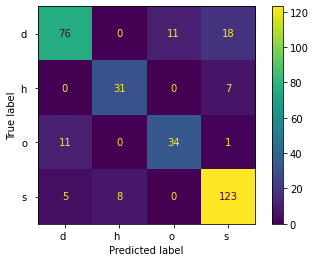

In [ ]:
clf = RandomForestClassifier(n_estimators = 180, oob_score=True)
clf.fit(x_train, y_train)

# plot_confusion_matrix(clf, x_test, y_test)  
# plt.show()

predictions = clf.predict(x_test)

print("training accuracy :", clf.score(x_train, y_train))
print("testing accuracy :", clf.score(x_test, y_test))

# ax = sns.heatmap(confusion_matrix(y_test,predictions))
# ax.set_xlabel('\nPredicted Values')
# ax.set_ylabel('Actual Values ')

plot_confusion_matrix(clf, x_test, y_test)  


plt.show()

In [ ]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

          d        0.83      0.72      0.77       105
          h        0.79      0.82      0.81        38
          o        0.76      0.74      0.75        46
          s        0.83      0.90      0.86       136

    accuracy                           0.81       325
   macro avg       0.80      0.80      0.80       325
weighted avg       0.81      0.81      0.81       325



In [ ]:
clf.estimators_[0] 

DecisionTreeClassifier(max_features='auto', random_state=1753934479)

training accuracy : 1.0
testing accuracy : 0.8092307692307692


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


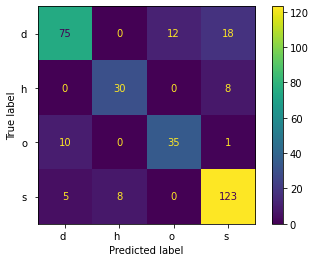

In [ ]:
clf2 = RandomForestClassifier(n_estimators = 180, oob_score=True)
clf2.fit(x_train, y_train)

# plot_confusion_matrix(clf, x_test, y_test)  
# plt.show()

predictions = clf2.predict(x_test)

print("training accuracy :", clf2.score(x_train, y_train))
print("testing accuracy :", clf2.score(x_test, y_test))

# ax = sns.heatmap(confusion_matrix(y_test,predictions))
# ax.set_xlabel('\nPredicted Values')
# ax.set_ylabel('Actual Values ')

plot_confusion_matrix(clf2, x_test, y_test)  


plt.show()

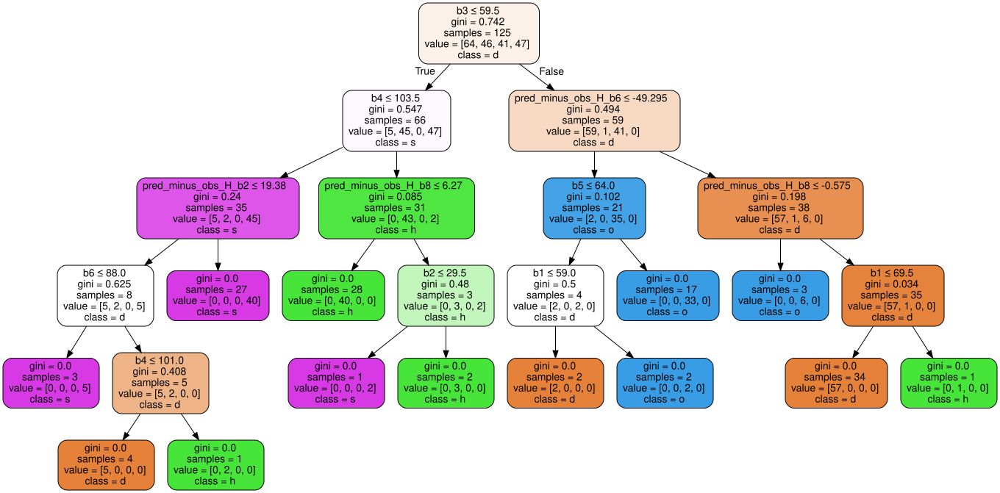

In [ ]:
from sklearn import tree
from sklearn.tree import export_graphviz

estimator = clf.estimators_[5]
import graphviz 
dot_data = tree.export_graphviz(estimator, out_file=None,  
                         feature_names=feature_name,   
                         class_names=class_name,   
                         filled=True, rounded=True,   
                         special_characters=True)   
 
graph = graphviz.Source(dot_data)   
graph

# graph.render("name of file",view = True)
# save_fig(graph)

# from subprocess import call
# call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# # Display in jupyter notebook
# from IPython.display import Image
# Image(filename = 'tree.png')

training accuracy : 1.0
testing accuracy : 0.7692307692307693


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


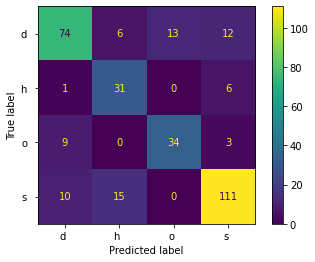

              precision    recall  f1-score   support

          d        0.79      0.70      0.74       105
          h        0.60      0.82      0.69        38
          o        0.72      0.74      0.73        46
          s        0.84      0.82      0.83       136

    accuracy                           0.77       325
   macro avg       0.74      0.77      0.75       325
weighted avg       0.78      0.77      0.77       325



In [ ]:
from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier(max_features='auto', random_state=528097675)
model.fit(x_train, y_train)

predictions = model.predict(x_test)

print("training accuracy :", model.score(x_train, y_train))
print("testing accuracy :", model.score(x_test, y_test))

plot_confusion_matrix(model, x_test, y_test) 

plt.show()
print(classification_report(y_test,predictions))

In [ ]:
estimator = clf.estimators_[5]

In [ ]:
estimator

DecisionTreeClassifier(max_features='auto', random_state=528097675)

In [ ]:
estimator2 = clf.estimators_[60]
estimator2

DecisionTreeClassifier(max_features='auto', random_state=1029412923)

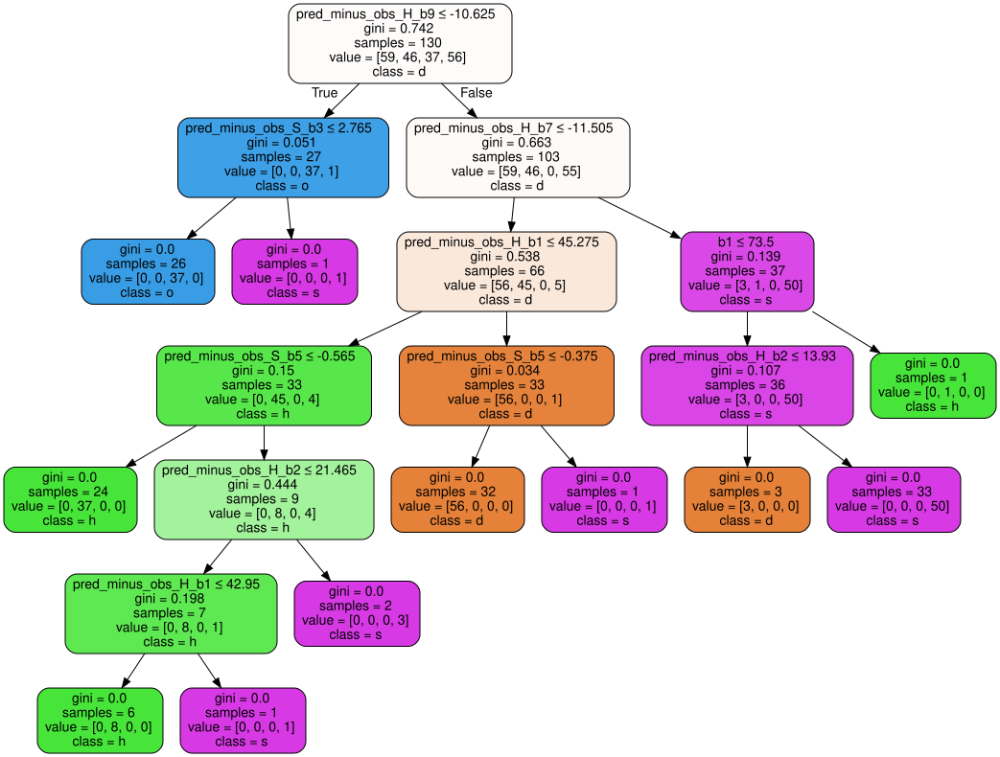

In [ ]:
dot_data = tree.export_graphviz(estimator2, out_file=None,  
                         feature_names=feature_name,   
                         class_names=class_name,   
                         filled=True, rounded=True,   
                         special_characters=True)   
 
graph = graphviz.Source(dot_data)   
graph


training accuracy : 1.0
testing accuracy : 0.7538461538461538

              precision    recall  f1-score   support

          d        0.79      0.64      0.71       105
          h        0.62      0.68      0.65        38
          o        0.71      0.85      0.77        46
          s        0.79      0.83      0.81       136

    accuracy                           0.75       325
   macro avg       0.73      0.75      0.73       325
weighted avg       0.76      0.75      0.75       325



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


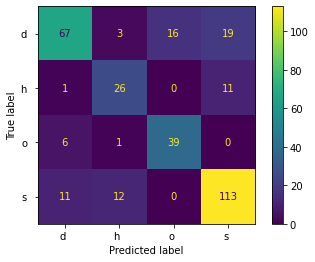

In [ ]:
from sklearn.tree import DecisionTreeClassifier
model2 = DecisionTreeClassifier(max_features='auto', random_state=1029412923)
model2.fit(x_train, y_train)

predictions = model2.predict(x_test)

print("training accuracy :", model2.score(x_train, y_train))
print("testing accuracy :", model2.score(x_test, y_test))

plot_confusion_matrix(model2, x_test, y_test) 

print()
print(classification_report(y_test,predictions))


In [ ]:
estimator3 = clf.estimators_[150]
estimator3

DecisionTreeClassifier(max_features='auto', random_state=1478106644)

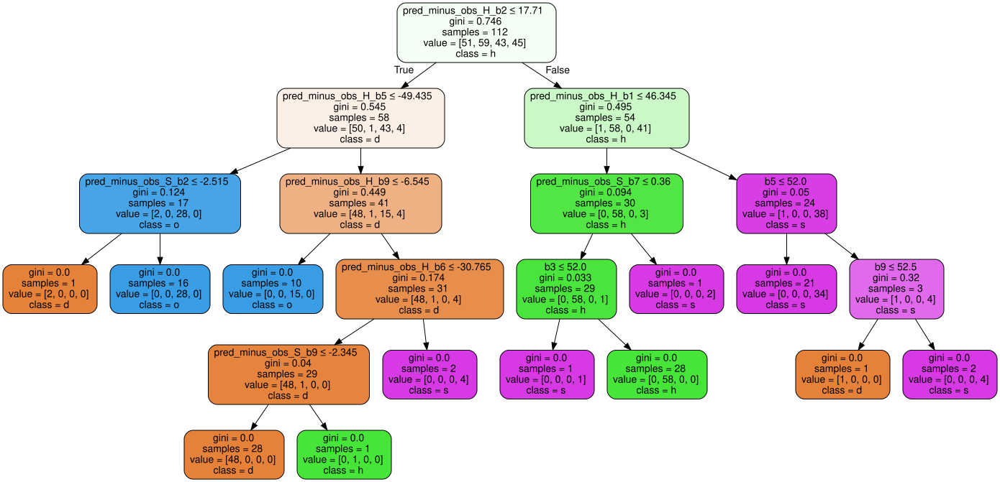

In [ ]:
dot_data = tree.export_graphviz(estimator3, out_file=None,  
                         feature_names=feature_name,   
                         class_names=class_name,   
                         filled=True, rounded=True,   
                         special_characters=True)   
 
graph = graphviz.Source(dot_data)   
graph

training accuracy : 1.0
testing accuracy : 0.7661538461538462

              precision    recall  f1-score   support

          d        0.73      0.81      0.77       105
          h        0.64      0.79      0.71        38
          o        0.80      0.72      0.76        46
          s        0.84      0.74      0.79       136

    accuracy                           0.77       325
   macro avg       0.75      0.76      0.75       325
weighted avg       0.78      0.77      0.77       325



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


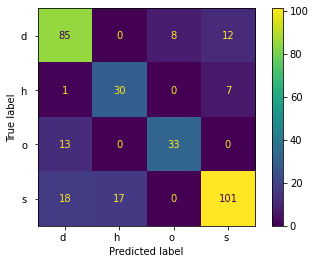

In [ ]:
from sklearn.tree import DecisionTreeClassifier
model3 = DecisionTreeClassifier(max_features='auto', random_state=1478106644)
model3.fit(x_train, y_train)

predictions = model3.predict(x_test)

print("training accuracy :", model3.score(x_train, y_train))
print("testing accuracy :", model3.score(x_test, y_test))

plot_confusion_matrix(model3, x_test, y_test) 

print()
print(classification_report(y_test,predictions))


In [ ]:
feature_scores = pd.Series(rfc.feature_importances_, index=x_train.columns).sort_values(ascending=False)

feature_scores

pred_minus_obs_H_b1    0.120905
pred_minus_obs_H_b2    0.097428
b2                     0.082510
b8                     0.077417
b3                     0.076214
pred_minus_obs_H_b9    0.069687
pred_minus_obs_H_b8    0.045443
b9                     0.044813
pred_minus_obs_H_b7    0.043810
pred_minus_obs_H_b5    0.043075
b4                     0.042867
pred_minus_obs_H_b3    0.040576
b5                     0.039486
b1                     0.031176
pred_minus_obs_H_b6    0.028359
pred_minus_obs_H_b4    0.027661
b6                     0.023178
b7                     0.021675
pred_minus_obs_S_b4    0.007324
pred_minus_obs_S_b2    0.006597
pred_minus_obs_S_b1    0.006355
pred_minus_obs_S_b6    0.005278
pred_minus_obs_S_b7    0.004682
pred_minus_obs_S_b5    0.003836
pred_minus_obs_S_b3    0.003604
pred_minus_obs_S_b9    0.003404
pred_minus_obs_S_b8    0.002640
dtype: float64

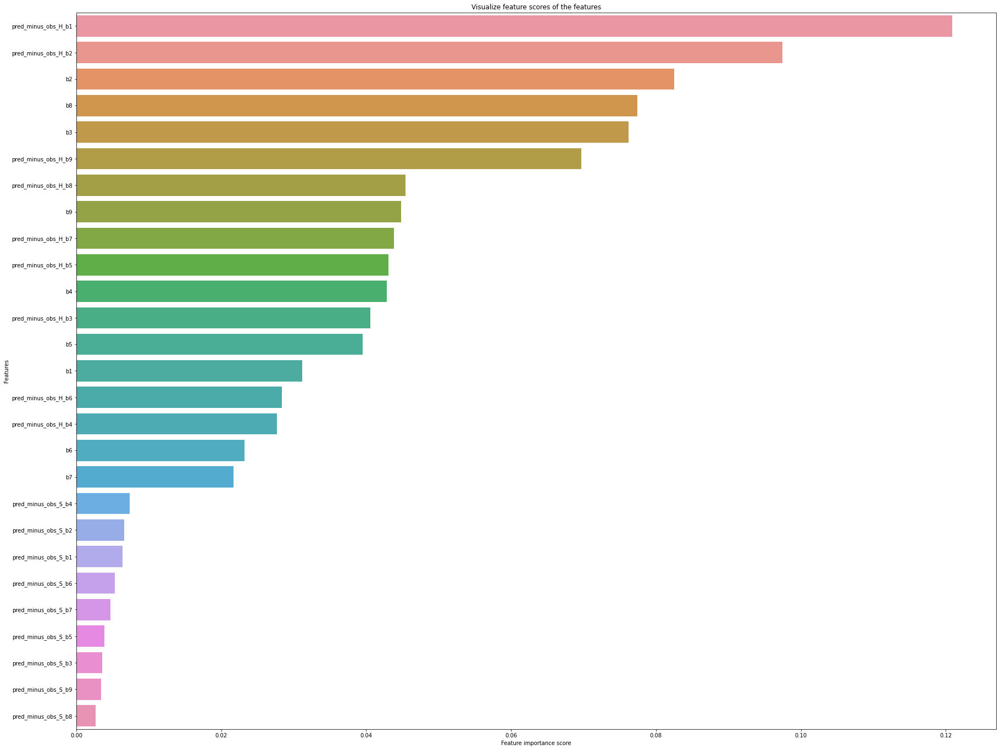

In [ ]:
# Creating a seaborn bar plot

f, ax = plt.subplots(figsize=(30, 24))
ax = sns.barplot(x=feature_scores, y=feature_scores.index)
ax.set_title("Visualize feature scores of the features")
ax.set_yticklabels(feature_scores.index)
ax.set_xlabel("Feature importance score")
ax.set_ylabel("Features")
plt.show()

In [ ]:
feature_scores1 = pd.Series(estimator.feature_importances_, index=x_train.columns).sort_values(ascending=False)

feature_scores1

b3                     0.299401
b4                     0.269613
pred_minus_obs_H_b6    0.227522
pred_minus_obs_H_b8    0.082412
pred_minus_obs_H_b2    0.034018
b6                     0.031588
b1                     0.026980
b2                     0.016329
b5                     0.012136
pred_minus_obs_S_b7    0.000000
pred_minus_obs_S_b1    0.000000
pred_minus_obs_S_b5    0.000000
pred_minus_obs_S_b8    0.000000
pred_minus_obs_S_b4    0.000000
pred_minus_obs_S_b3    0.000000
pred_minus_obs_S_b2    0.000000
pred_minus_obs_S_b6    0.000000
pred_minus_obs_H_b5    0.000000
pred_minus_obs_H_b9    0.000000
pred_minus_obs_H_b7    0.000000
pred_minus_obs_H_b4    0.000000
pred_minus_obs_H_b3    0.000000
pred_minus_obs_H_b1    0.000000
b9                     0.000000
b8                     0.000000
b7                     0.000000
pred_minus_obs_S_b9    0.000000
dtype: float64

In [ ]:
feature_scores2 = pd.Series(estimator2.feature_importances_, index=x_train.columns).sort_values(ascending=False)

feature_scores2

pred_minus_obs_H_b1    0.337063
pred_minus_obs_H_b7    0.282478
pred_minus_obs_H_b9    0.264798
pred_minus_obs_H_b2    0.062702
pred_minus_obs_S_b5    0.027068
pred_minus_obs_S_b3    0.013249
b1                     0.012642
pred_minus_obs_S_b8    0.000000
pred_minus_obs_S_b7    0.000000
pred_minus_obs_S_b6    0.000000
pred_minus_obs_S_b4    0.000000
pred_minus_obs_S_b2    0.000000
pred_minus_obs_S_b1    0.000000
pred_minus_obs_H_b8    0.000000
pred_minus_obs_H_b5    0.000000
pred_minus_obs_H_b6    0.000000
b2                     0.000000
pred_minus_obs_H_b4    0.000000
pred_minus_obs_H_b3    0.000000
b9                     0.000000
b8                     0.000000
b7                     0.000000
b6                     0.000000
b5                     0.000000
b4                     0.000000
b3                     0.000000
pred_minus_obs_S_b9    0.000000
dtype: float64

In [ ]:
feature_scores3 = pd.Series(estimator3.feature_importances_, index=x_train.columns).sort_values(ascending=False)

feature_scores3

pred_minus_obs_H_b2    0.302796
pred_minus_obs_H_b1    0.283558
pred_minus_obs_H_b9    0.144542
pred_minus_obs_H_b5    0.129686
pred_minus_obs_H_b6    0.049069
pred_minus_obs_S_b7    0.025311
pred_minus_obs_S_b2    0.025274
b3                     0.013310
pred_minus_obs_S_b9    0.013263
b9                     0.010832
b5                     0.002361
b8                     0.000000
pred_minus_obs_S_b8    0.000000
b4                     0.000000
pred_minus_obs_S_b6    0.000000
pred_minus_obs_S_b5    0.000000
pred_minus_obs_S_b4    0.000000
pred_minus_obs_S_b3    0.000000
pred_minus_obs_S_b1    0.000000
b6                     0.000000
pred_minus_obs_H_b8    0.000000
pred_minus_obs_H_b7    0.000000
b7                     0.000000
b2                     0.000000
pred_minus_obs_H_b4    0.000000
pred_minus_obs_H_b3    0.000000
b1                     0.000000
dtype: float64

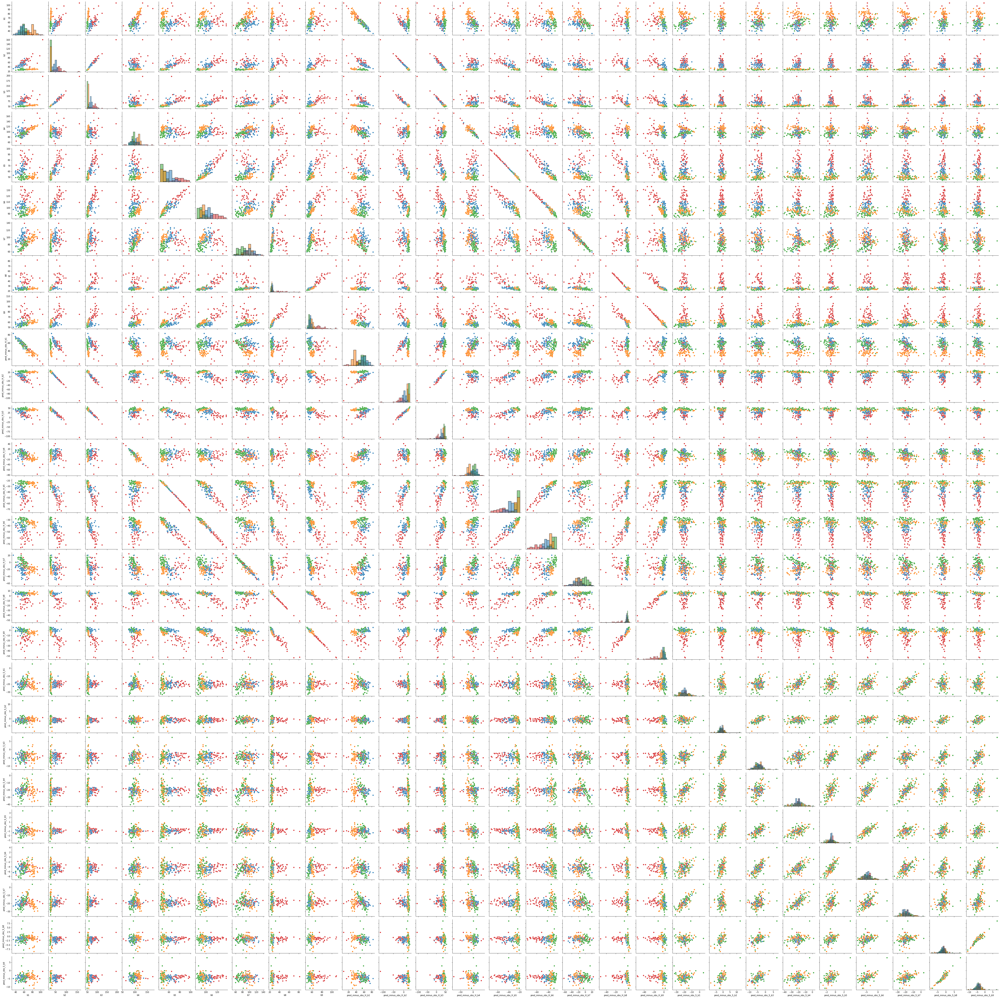

In [ ]:
g = sns.PairGrid(dftraining,hue = "class")
g.map_diag(sns.histplot)
g.map_offdiag(sns.scatterplot)

In [ ]:
#Applying the Gaussian Naive Bayes classifier on the training set

from sklearn.naive_bayes import GaussianNB


# instantiate the model
gnb = GaussianNB()


# fit the model
gnb.fit(x_train, y_train)

GaussianNB()

In [ ]:
y_pred = gnb.predict(x_test)

y_pred

array(['o ', 's ', 's ', 'd ', 's ', 'd ', 'h ', 'd ', 'h ', 'd ', 's ',
       'o ', 'd ', 'h ', 'o ', 's ', 'o ', 'd ', 's ', 'd ', 'o ', 's ',
       's ', 's ', 's ', 's ', 's ', 'd ', 's ', 'd ', 's ', 'o ', 's ',
       's ', 'd ', 'd ', 'd ', 'd ', 'h ', 'o ', 'd ', 'h ', 'o ', 'o ',
       's ', 'd ', 's ', 's ', 'h ', 's ', 'o ', 'o ', 'h ', 'h ', 'd ',
       's ', 'h ', 'o ', 'h ', 'h ', 's ', 'd ', 's ', 's ', 'h ', 's ',
       'd ', 'd ', 'd ', 's ', 's ', 'd ', 'o ', 's ', 'h ', 's ', 'h ',
       's ', 's ', 's ', 'd ', 's ', 's ', 'h ', 'd ', 's ', 's ', 'o ',
       'd ', 's ', 'o ', 'd ', 's ', 's ', 's ', 'd ', 'd ', 's ', 'd ',
       'd ', 's ', 'h ', 's ', 's ', 's ', 'h ', 'o ', 'o ', 'o ', 's ',
       'o ', 's ', 'd ', 'd ', 's ', 'o ', 'o ', 'd ', 's ', 'h ', 'd ',
       'h ', 'd ', 's ', 's ', 's ', 's ', 'd ', 'd ', 'o ', 'd ', 'd ',
       's ', 's ', 'd ', 's ', 'o ', 'd ', 'o ', 'd ', 'd ', 'd ', 's ',
       'o ', 'd ', 'd ', 's ', 'o ', 's ', 'h ', 'h

In [ ]:
print('Model accuracy score: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

Model accuracy score: 0.8031


In [ ]:
y_pred_train = gnb.predict(x_train)

y_pred_train

In [ ]:
print('Training-set accuracy score: {0:0.4f}'. format(accuracy_score(y_train, y_pred_train)))

Training-set accuracy score: 0.9646


In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

          d        0.81      0.77      0.79       105
          h        0.71      0.79      0.75        38
          o        0.77      0.80      0.79        46
          s        0.84      0.83      0.83       136

    accuracy                           0.80       325
   macro avg       0.78      0.80      0.79       325
weighted avg       0.80      0.80      0.80       325



/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


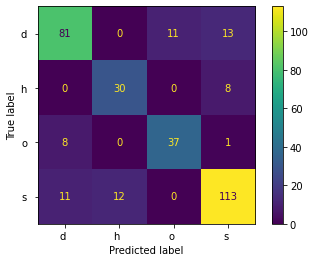

In [ ]:
plot_confusion_matrix(gnb, x_test, y_test) 

plt.show()